<a href="https://colab.research.google.com/github/DarekGit/neural_style/blob/main/neural_style.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/DarekGit/neural_style.git
!python neural_style/models/download_models.py
from neural_style.neural_style import neural, params

Cloning into 'neural_style'...
remote: Enumerating objects: 15, done.
remote: Counting objects: 100% (15/15), done.
remote: Compressing objects: 100% (15/15), done.
remote: Total 110 (delta 8), reused 0 (delta 0), pack-reused 95
Receiving objects: 100% (110/110), 44.37 MiB | 14.02 MiB/s, done.
Resolving deltas: 100% (16/16), done.
Downloading: "https://web.eecs.umich.edu/~justincj/models/vgg19-d01eb7cb.pth" to /root/.cache/torch/hub/checkpoints/vgg19-d01eb7cb.pth
100% 548M/548M [00:32<00:00, 17.7MB/s]
Downloading: "https://web.eecs.umich.edu/~justincj/models/vgg16-00b39a1b.pth" to /root/.cache/torch/hub/checkpoints/vgg16-00b39a1b.pth
100% 528M/528M [00:31<00:00, 17.6MB/s]
All models have been successfully downloaded


In [2]:
params._help(True)


style_image          : neural/examples/inputs/seated-nude.jpg Style target image
style_blend_weights  : None                             
content_image        : neural/examples/inputs/tubingen.jpg Content target image
image_size           : 512                              Maximum height / width of generated image, type=int
gpu                  : 0                                Zero-indexed ID of the GPU to use; for CPU mode set -gpu = c
content_weight       : 5.0                              type=float
style_weight         : 100.0                            type=float
normalize_weights    : False                            
tv_weight            : 0.001                            type=float
num_iterations       : 1000                             type=int
init                 : random                           choices=['random', 'image']
init_image           : None                             
optimizer            : lbfgs                            choices=['lbfgs', 'adam']
learning_ra

reseted to default parameters
*****

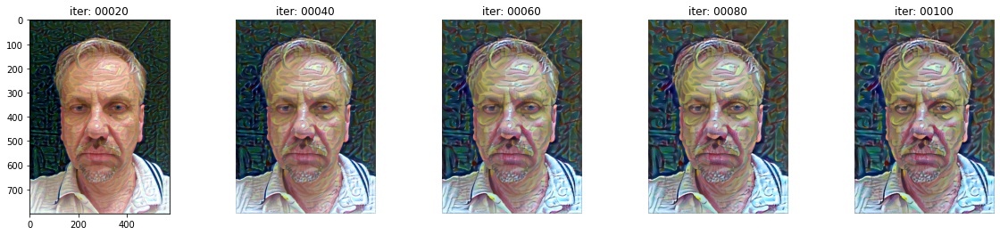

*****

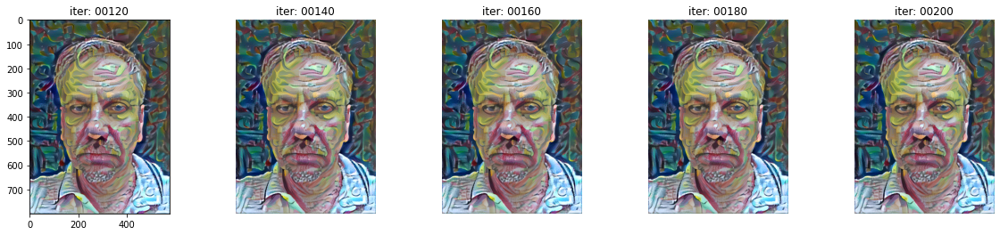

*****

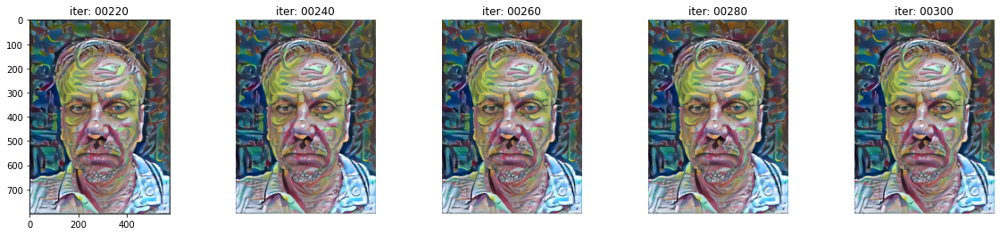

*****

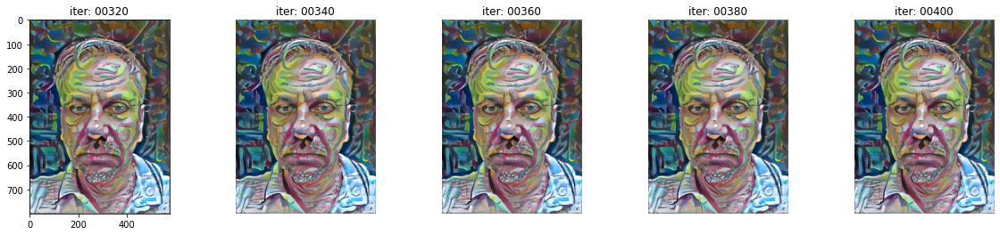

*****

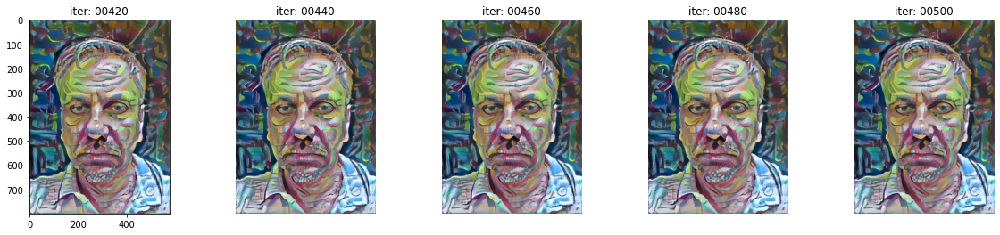

*****

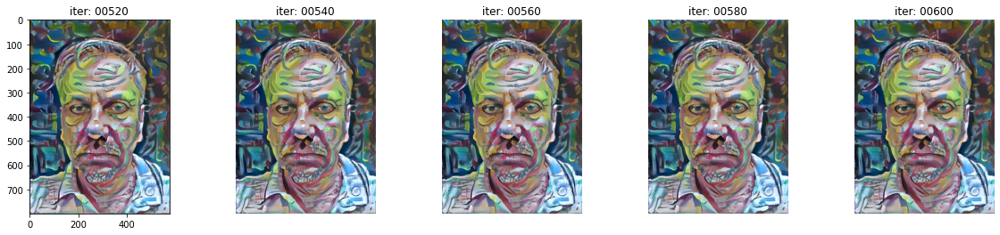

*****

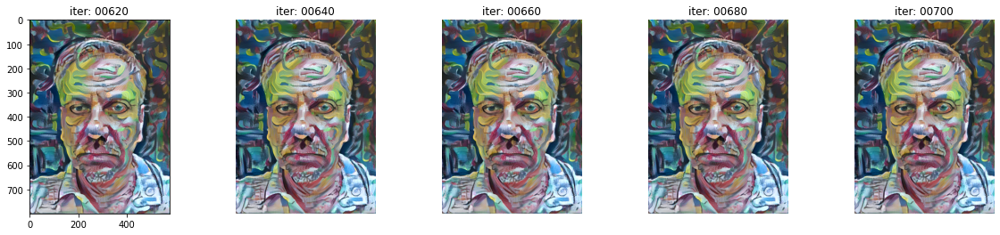

*****

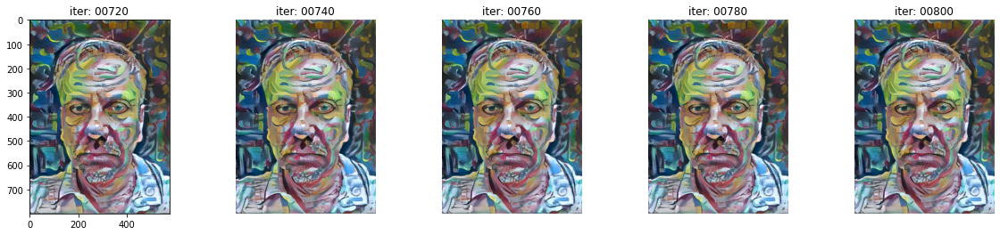

*****

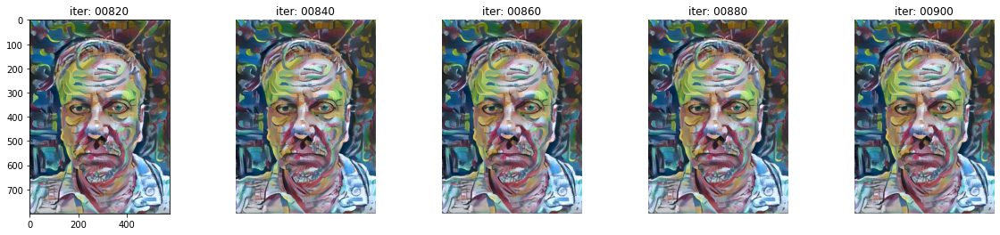

*****

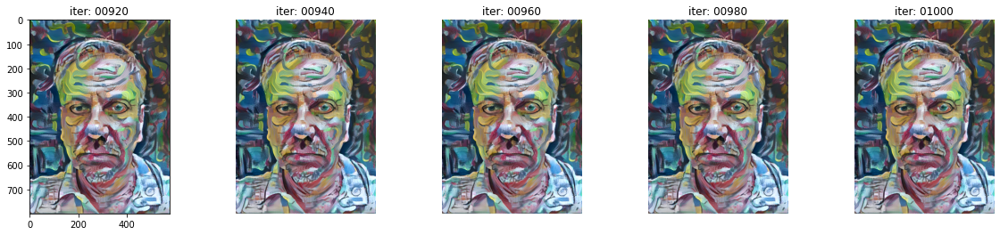

*****

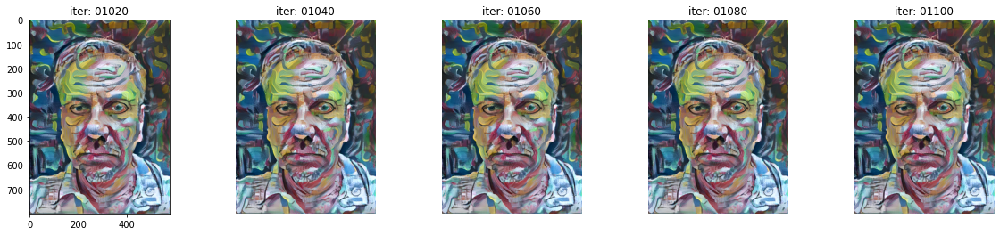

*****

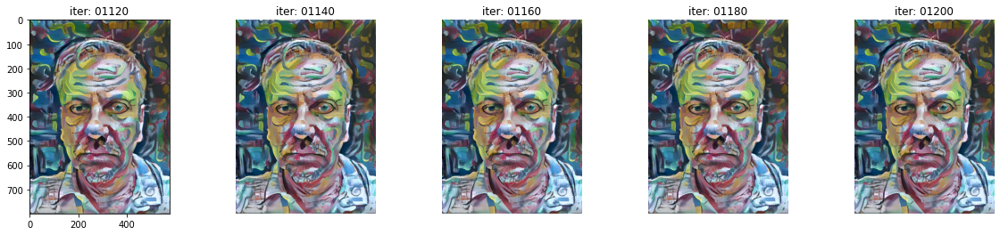

*****

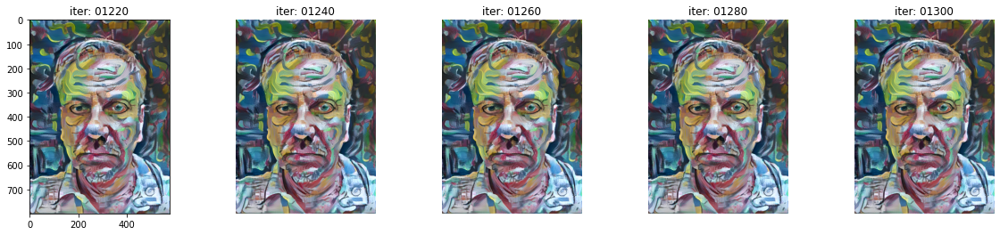

*****

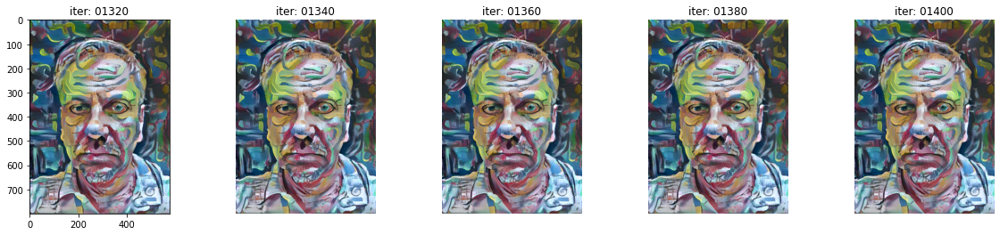

*****

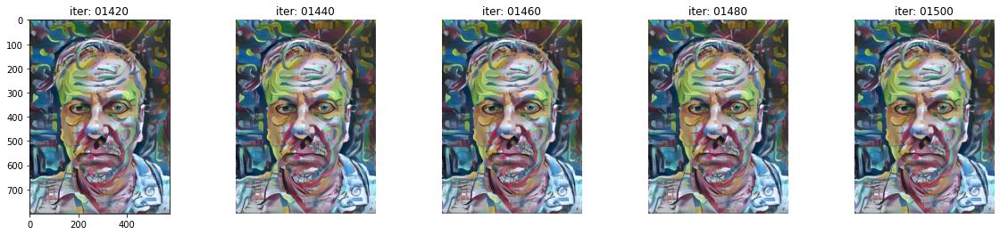

*****

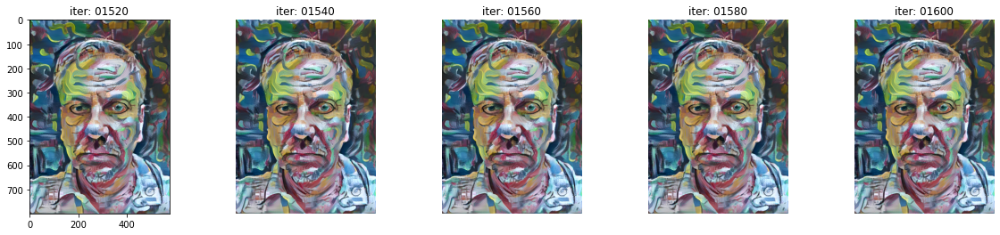

*****

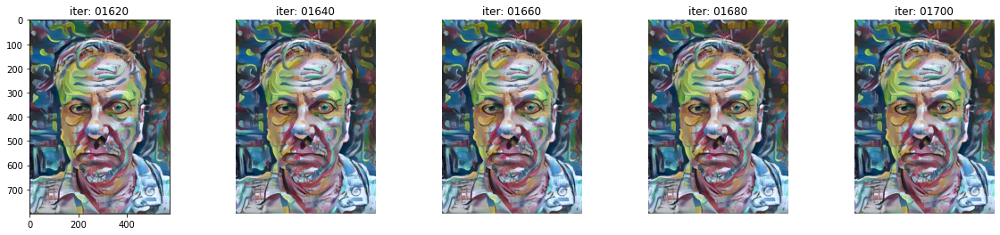

*****

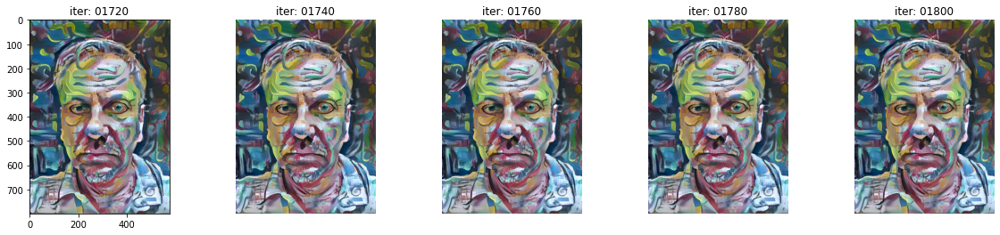

*****

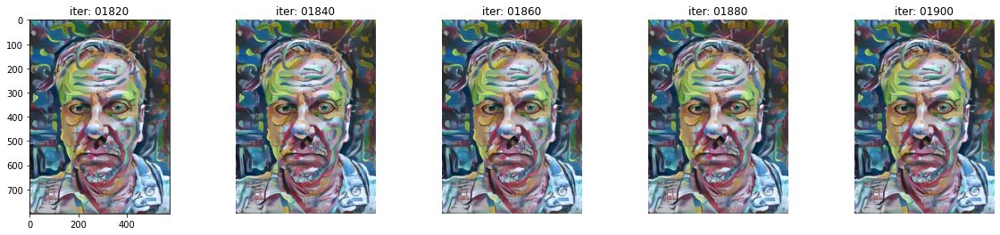

*****

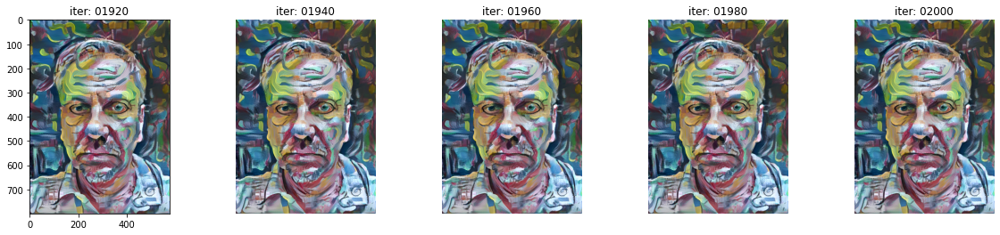

In [3]:
params._reset()
params.content_image  = './neural_style/examples/inputs/DD.jpg'
params.style_image          = './neural_style/examples/inputs/ZD_face.jpg'
params.init_image           = './neural_style/examples/inputs/DD.jpg'  
params.init                 = 'image'
params.image_size           = 800
params.normalize_weights    = True
params.num_iterations       = 2000
params.content_weight       = 1
params.style_weight         = 20000

neural(params)

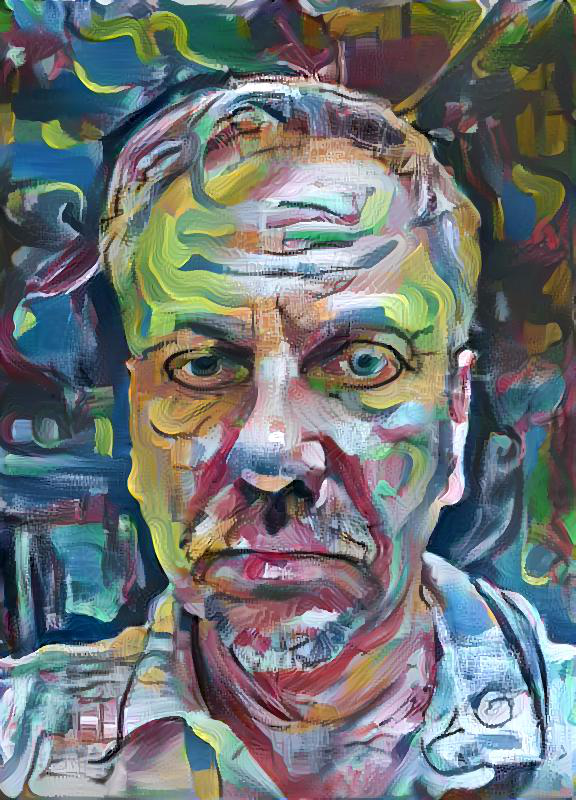

In [4]:
from PIL import Image
Image.open('neural_style/examples/configs/OUT_000042.jpg')

*****

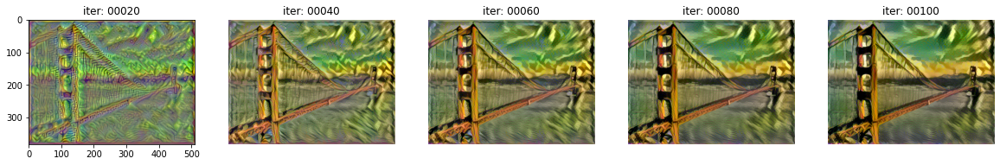

*****

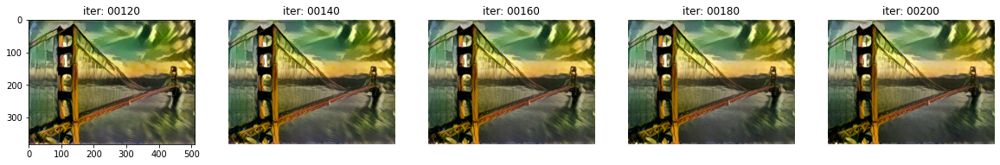

*****

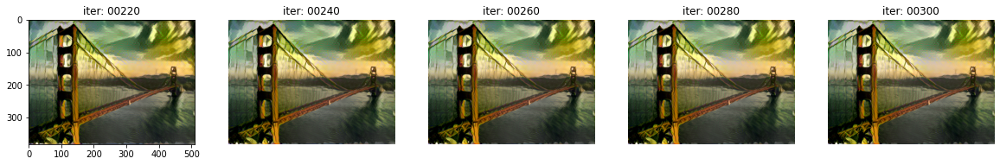

*****

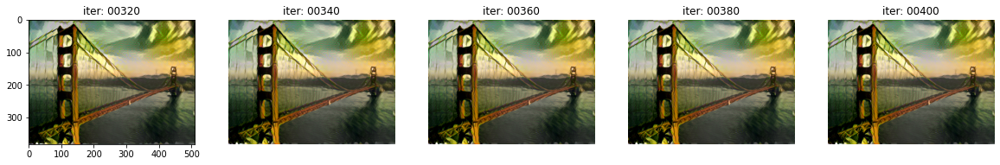

*****

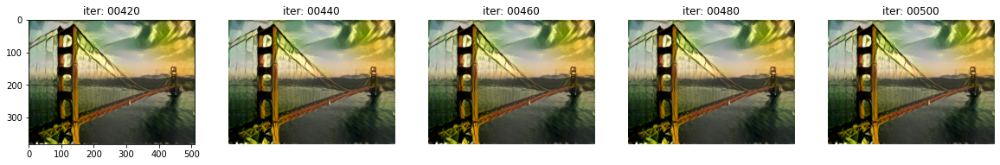

*****

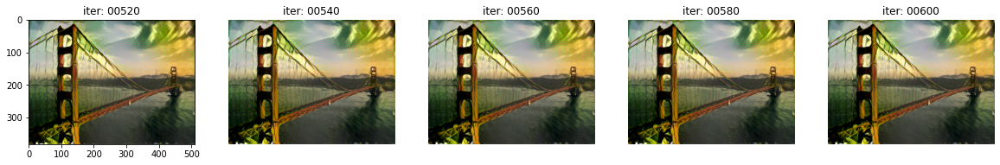

*****

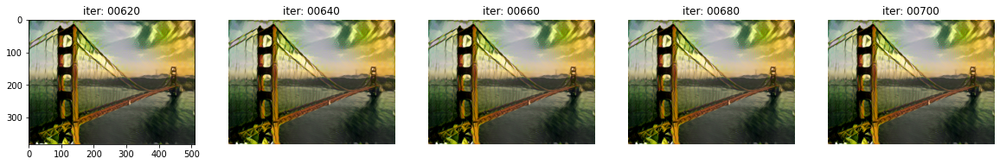

*****

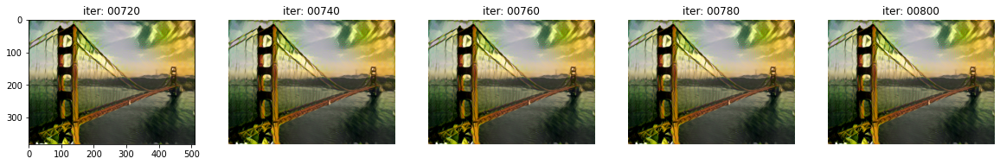

*****

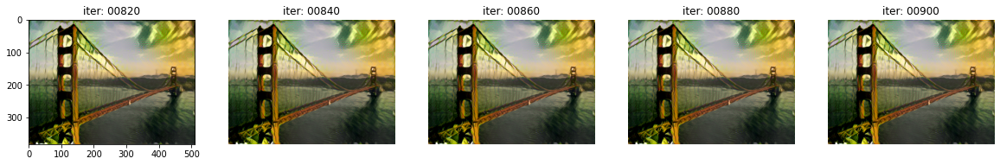

*****

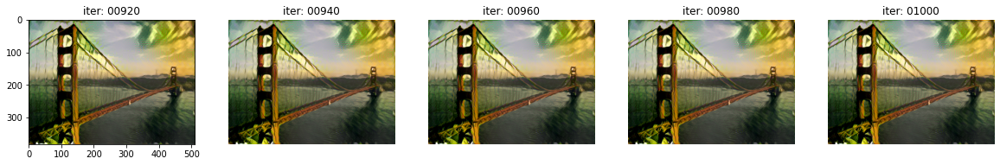

In [5]:
params._load('neural_style/examples/configs/OUT_Params_000043.json')
neural(params)

In [9]:
!zip -ru Outputs Outputs/WORK*/OUT*
!rm -rf Outputs

In [8]:
#example of module neural_style.py
import os
import copy
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms

from PIL import Image
import matplotlib.pyplot as plt
from neural_style.CaffeLoader import loadCaffemodel, ModelParallel
import json

Image.MAX_IMAGE_PIXELS = 1000000000 # Support gigapixel images


class Param():
    # Basic options
    style_image = 'neural_style/examples/inputs/seated-nude.jpg'
    style_blend_weights = None
    content_image = 'neural_style/examples/inputs/tubingen.jpg'
    image_size = 512
    gpu = 0
    # Optimization options
    content_weight = 5e0
    style_weight = 1e2
    normalize_weights = False
    tv_weight = 1e-3 
    num_iterations = 1000
    init = 'random'
    init_image = None
    optimizer ='lbfgs'
    learning_rate = 1e0
    lbfgs_num_correction = 100
    # Output options
    print_iter = 0 
    save_iter = 100
    graph_iter = 20
    output_image = 'out.jpg'
    output_dir = 'Outputs'
    # Other options
    style_scale = 1.0
    original_colors = 0
    pooling ='avg'
    model_file = 'VGG19'
    disable_check = True
    backend = 'cudnn'
    cudnn_autotune = True
    seed =-1
    content_layers ='relu4_2'
    style_layers = 'relu1_1,relu2_1,relu3_1,relu4_1,relu5_1'
    multidevice_strategy = '4,7,29'
    debug = False
    

    _H={
    "style_image":  ["Style target image", "neural/examples/inputs/seated-nude.jpg", 1],
    "style_blend_weights":  ["",None, 1],
    "content_image":  ["Content target image", "neural/examples/inputs/tubingen.jpg", 1],
    "image_size":  ["Maximum height / width of generated image, type=int", 512, 1],
    "gpu":  ["Zero-indexed ID of the GPU to use; for CPU mode set -gpu = c", 0, 0],
    "content_weight":  ["type=float", 5e0, 1],
    "style_weight":  ["type=float", 1e2, 1],
    "normalize_weights":  ["", False, 1],
    "tv_weight":  ["type=float", 1e-3, 1],
    "num_iterations":  ["type=int", 1000, 1],
    "init":  ["choices=['random', 'image']", "random", 1],
    "init_image":  ["",None, 1],
    "optimizer":  ["choices=['lbfgs', 'adam']", "lbfgs", 0],
    "learning_rate":  ["type=float", 1e0, 0],
    "lbfgs_num_correction":  ["type=int", 100, 0],
    "print_iter":  ["type=int", 0, 1],
    "save_iter":  ["type=int", 100, 1],
    "graph_iter":  ["type=int", 20, 1],
    "output_image":  ["","out.jpg", 1],
    "output_dir": ["directory for work outputs",'Outputs', 1],
    "style_scale":  ["type=float", 1.0, 1],
    "original_colors":  ["type=int, choices=[0, 1]", 0, 1],
    "pooling":  ["choices=['avg', 'max']", "avg", 1],
    "model_file":  ["type=str, choice=[VGG19, VGG16, NIN]", "VGG19", 1],
    "disable_check":  ["", True, 0],
    "backend":  ["choices=['nn', 'cudnn', 'mkl', 'mkldnn', 'openmp', 'mkl,cudnn', 'cudnn,mkl']", "cudnn", 0],
    "cudnn_autotune":  ["", True, 0],
    "seed":  ["type=int", -1, 1],
    "content_layers":  ["layers for content", "relu4_2", 0],
    "style_layers":  ["layers for style", "relu1_1,relu2_1,relu3_1,relu4_1,relu5_1", 0],
    "multidevice_strategy":  ["","'4,7,29'", 0],
    "debug": ["presents debug information",False, 0],
    }

    _Model_pth={"VGG16":"neural_style/models/vgg16-00b39a1b.pth",
          "VGG19":"neural_style/models/vgg19-d01eb7cb.pth",
          "NIN":"neural_style/models/nin_imagenet.pth"}

    def _show(self,all=False):
        for k  in [x for x in dir(self) if '_' not in x[0]]:
            if all or self._H[k][2]:
                print("{:20s} = {}".format(k,self.__getattribute__(k)))

    def _reset(self):
        for k,v in self._H.items():
           self.__setattr__(k,v[1])
        print('reseted to default parameters')

    def _help(self, all=False):
        for k,v in [x for x in self._H.items() if x[1][2] or all]:
           print("{:20s} : {:32s} {}".format(k,str(v[1]),v[0]))
        print('\n Functions: _help(), _show(), _reset(), _get(), _load(), _save()')
    
    def _get(self):
        return {k: self.__getattribute__(k) for k in [x for x in dir(self) if '_' not in x[0]]}

    def _load(self, data):
        if isinstance(data,str):
            if not os.path.isfile(data): 
              print('no such a file: ',data)
              return 
            with open(data,'r') as f:
              data = json.load(f)

        if not isinstance(data,dict):
            print('no dictionary format - ',type(data))
            return
      
        for k  in [x for x in dir(self) if '_' not in x[0]]:
            if k in data.keys():
                self.__setattr__(k,data[k])

    def _save(self,file):
        with open(file,'w') as f:
            json.dump({k: self.__getattribute__(k) for k in [x for x in dir(self) if '_' not in x[0]]},f)

params = Param()
output_image = params.output_image

class Buff():
  def __init__(self,max):
      self.buff =[]
      self.max = max
      self.i = 0

  def __call__(self,data):
    if len(self.buff) < self.max:
      self.buff.append(data)
      self.i = (self.i+1)%self.max
    else:
      self.buff[i] = data
      self.i = (self.i+1)%self.max
  
  def len(self):
      return len(self.buff)

  def reset(self):
      self.buff=[]

  def get(self):
      return self.buff



def neural(params=Param()): 

    dtype, multidevice, backward_device = setup_gpu()

    if not os.path.isdir(params.output_dir): os.mkdir(params.output_dir)
    L = sorted([x for x in os.listdir(params.output_dir) if "WORK_" in x ])
    if L == []:
        WORK='000001'
        opath = os.path.join(params.output_dir, 'WORK_'+WORK)
        os.mkdir(opath)
    else:
        WORK=str(int(L[-1].split('_')[-1])+1).zfill(6)
        opath = os.path.join(params.output_dir,'WORK_'+WORK)
        os.mkdir(opath)
    f = os.path.splitext(os.path.split(params.output_image)[-1])[0]
    params._save(os.path.join(opath, f.upper() +'_Params_'+WORK+'.json'))
    output_image = os.path.join(opath,os.path.split(params.output_image)[-1])
    

    cnn, layerList = loadCaffemodel(params._Model_pth[params.model_file], params.pooling, params.gpu, params.disable_check, params.debug)

    content_image = preprocess(params.content_image, params.image_size).type(dtype)
    style_image_input = params.style_image.split(',')
    style_image_list, ext = [], [".jpg", ".jpeg", ".png", ".tiff"]
    for image in style_image_input:
        if os.path.isdir(image):
            images = (os.path.join(image, f) for f in os.listdir(image)
            if os.path.splitext(f)[1].lower() in ext)
            style_image_list.extend(images)
        else:
            style_image_list.append(image)
    style_images_caffe = []
    for image in style_image_list:
        style_size = int(params.image_size * params.style_scale)
        img_caffe = preprocess(image, style_size).type(dtype)
        style_images_caffe.append(img_caffe)

    if params.init_image != None:
        image_size = (content_image.size(2), content_image.size(3))
        init_image = preprocess(params.init_image, image_size).type(dtype)

    # Handle style blending weights for multiple style inputs
    style_blend_weights = []
    if params.style_blend_weights == None:
        # Style blending not specified, so use equal weighting
        for i in style_image_list:
            style_blend_weights.append(1.0)
        for i, blend_weights in enumerate(style_blend_weights):
            style_blend_weights[i] = int(style_blend_weights[i])
    else:
        style_blend_weights = params.style_blend_weights.split(',')
        assert len(style_blend_weights) == len(style_image_list), \
          "-style_blend_weights and -style_images must have the same number of elements!"

    # Normalize the style blending weights so they sum to 1
    style_blend_sum = 0
    for i, blend_weights in enumerate(style_blend_weights):
        style_blend_weights[i] = float(style_blend_weights[i])
        style_blend_sum = float(style_blend_sum) + style_blend_weights[i]
    for i, blend_weights in enumerate(style_blend_weights):
        style_blend_weights[i] = float(style_blend_weights[i]) / float(style_blend_sum)

    content_layers = params.content_layers.split(',')
    style_layers = params.style_layers.split(',')

    # Set up the network, inserting style and content loss modules
    cnn = copy.deepcopy(cnn)
    content_losses, style_losses, tv_losses = [], [], []
    next_content_idx, next_style_idx = 1, 1
    net = nn.Sequential()
    c, r = 0, 0
    if params.tv_weight > 0:
        tv_mod = TVLoss(params.tv_weight).type(dtype)
        net.add_module(str(len(net)), tv_mod)
        tv_losses.append(tv_mod)

    for i, layer in enumerate(list(cnn), 1):
        if next_content_idx <= len(content_layers) or next_style_idx <= len(style_layers):
            if isinstance(layer, nn.Conv2d):
                net.add_module(str(len(net)), layer)

                if layerList['C'][c] in content_layers:
                    if params.debug: print("Setting up content layer " + str(i) + ": " + str(layerList['C'][c]))
                    loss_module = ContentLoss(params.content_weight, params.normalize_weights)
                    net.add_module(str(len(net)), loss_module)
                    content_losses.append(loss_module)

                if layerList['C'][c] in style_layers:
                    if params.debug: print("Setting up style layer " + str(i) + ": " + str(layerList['C'][c]))
                    loss_module = StyleLoss(params.style_weight, params.normalize_weights)
                    net.add_module(str(len(net)), loss_module)
                    style_losses.append(loss_module)
                c+=1

            if isinstance(layer, nn.ReLU):
                net.add_module(str(len(net)), layer)

                if layerList['R'][r] in content_layers:
                    if params.debug: print("Setting up content layer " + str(i) + ": " + str(layerList['R'][r]))
                    loss_module = ContentLoss(params.content_weight)
                    net.add_module(str(len(net)), loss_module)
                    content_losses.append(loss_module)
                    next_content_idx += 1

                if layerList['R'][r] in style_layers:
                    if params.debug: print("Setting up style layer " + str(i) + ": " + str(layerList['R'][r]))
                    loss_module = StyleLoss(params.style_weight)
                    net.add_module(str(len(net)), loss_module)
                    style_losses.append(loss_module)
                    next_style_idx += 1
                r+=1

            if isinstance(layer, nn.MaxPool2d) or isinstance(layer, nn.AvgPool2d):
                net.add_module(str(len(net)), layer)

    if multidevice:
        net = setup_multi_device(net)

    # Capture content targets
    for i in content_losses:
        i.mode = 'capture'
    if params.debug: 
        print("Capturing content targets")
        print_torch(net, multidevice)
    net(content_image)

    # Capture style targets
    for i in content_losses:
        i.mode = 'None'

    for i, image in enumerate(style_images_caffe):
        if params.debug: print("Capturing style target " + str(i+1))
        for j in style_losses:
            j.mode = 'capture'
            j.blend_weight = style_blend_weights[i]
        net(style_images_caffe[i])

    # Set all loss modules to loss mode
    for i in content_losses:
        i.mode = 'loss'
    for i in style_losses:
        i.mode = 'loss'

    # Maybe normalize content and style weights  !!! doesn't work, changed to backword
    #if params.normalize_weights:
    #    normalize_weights(content_losses, style_losses)

    # Freeze the network in order to prevent
    # unnecessary gradient calculations
    for param in net.parameters():
        param.requires_grad = False

    # Initialize the image
    if params.seed >= 0:
        torch.manual_seed(params.seed)
        torch.cuda.manual_seed_all(params.seed)
        torch.backends.cudnn.deterministic=True
    if params.init == 'random':
        B, C, H, W = content_image.size()
        img = torch.randn(C, H, W).mul(0.001).unsqueeze(0).type(dtype)
    elif params.init == 'image':
        if params.init_image != None:
            img = init_image.clone()
        else:
            img = content_image.clone()
    img = nn.Parameter(img)

    def maybe_print(t, loss):
        if params.print_iter > 0 and t % params.print_iter == 0:
            print("Iteration " + str(t) + " / "+ str(params.num_iterations))
            for i, loss_module in enumerate(content_losses):
                print("  Content " + str(i+1) + " loss: " + str(loss_module.loss.item()))
            for i, loss_module in enumerate(style_losses):
                print("  Style " + str(i+1) + " loss: " + str(loss_module.loss.item()))
            print("  Total loss: " + str(loss.item()))

    def maybe_save(t):
        should_save = params.save_iter > 0 and t % params.save_iter == 0
        should_save = should_save or t == params.num_iterations
        if should_save:
            path, fname = os.path.split(output_image)
            f, ext = os.path.splitext(fname)
            if t == params.num_iterations:
                filename = os.path.join(path, f.upper() + '_' + WORK +ext)
            else:
                filename = os.path.join(path, f + "_" + WORK + '_' + str(t).zfill(6) + ext)
            disp = deprocess(img.clone())

            # Maybe perform postprocessing for color-independent style transfer
            if params.original_colors == 1:
                disp = original_colors(deprocess(content_image.clone()), disp)

            disp.save(str(filename))

    def maybe_graph(t):
        should_disp = params.graph_iter > 0 and t % params.graph_iter == 0
        should_disp = should_disp or t == params.num_iterations

        if should_disp:
            i= t%(params.graph_iter*5)//params.graph_iter
            i= 5 if i ==0 else i
            
            disp = deprocess(img.clone())
            # Maybe perform postprocessing for color-independent style transfer
            if params.original_colors == 1:
                disp = original_colors(deprocess(content_image.clone()), disp)
            if params.print_iter==0: print(end='*')
            B5((disp,t))
            
            if i==5 or t == params.num_iterations:
                if params.print_iter==0: print('\b'*B5.len(),end='')
                fig, axs = plt.subplots(1, B5.len(), figsize=(B5.len()*4,4))
                for k,(im,l) in enumerate(B5.get()):           
                  axs[k].imshow(im)
                  if k != 0: axs[k].axis('off'); 
                  axs[k].set_title('iter: '+str(l).zfill(5))
                B5.reset()
                plt.show()

        if t in [int(x*params.num_iterations/25) for x in range(1,26)]:
            disp = deprocess(img.clone())
            if params.original_colors == 1:
                disp = original_colors(deprocess(content_image.clone()), disp)
            B25((disp,t))
        if t==params.num_iterations:
            path, fname = os.path.split(output_image)
            f, ext = os.path.splitext(fname)

            filename = os.path.join(path,f.upper() + '_Figs_' + WORK + ext)
            fig, axs = plt.subplots(5, 5, figsize=(30,30))
            for k,(im,l) in enumerate(B25.get()):           
                axs[k//5,k%5].imshow(im)
                if k != 0: axs[k//5,k%5].axis('off'); 
                axs[k//5,k%5].set_title('iter: '+str(l).zfill(5))
            B25.reset()
            plt.savefig(filename)
            plt.close(fig)

            

    # Function to evaluate loss and gradient. We run the net forward and
    # backward to get the gradient, and sum up losses from the loss modules.
    # optim.lbfgs internally handles iteration and calls this function many
    # times, so we manually count the number of iterations to handle printing
    # and saving intermediate results.
    num_calls = [0]
    B5  = Buff(5)
    B25 = Buff(25)
    def feval():
        num_calls[0] += 1
        optimizer.zero_grad()
        net(img)
        loss = 0

        for mod in content_losses:
            loss += mod.loss.to(backward_device)
        for mod in style_losses:
            loss += mod.loss.to(backward_device)
        if params.tv_weight > 0:
            for mod in tv_losses:
                loss += mod.loss.to(backward_device)

        loss.backward()

        maybe_save(num_calls[0])
        maybe_graph(num_calls[0])
        maybe_print(num_calls[0], loss)

        return loss

    optimizer, loopVal = setup_optimizer(img)
    while num_calls[0] <= loopVal:
         optimizer.step(feval)


# Configure the optimizer
def setup_optimizer(img):
    if params.optimizer == 'lbfgs':
        if params.debug: print("Running optimization with L-BFGS")
        optim_state = {
            'max_iter': params.num_iterations,
            'tolerance_change': -1,
            'tolerance_grad': -1,
        }
        if params.lbfgs_num_correction != 100:
            optim_state['history_size'] = params.lbfgs_num_correction
        optimizer = optim.LBFGS([img], **optim_state)
        loopVal = 1
    elif params.optimizer == 'adam':
        if params.debug: print("Running optimization with ADAM")
        optimizer = optim.Adam([img], lr = params.learning_rate)
        loopVal = params.num_iterations - 1
    return optimizer, loopVal


def setup_gpu():
    def setup_cuda():
        if 'cudnn' in params.backend:
            torch.backends.cudnn.enabled = True
            if params.cudnn_autotune:
                torch.backends.cudnn.benchmark = True
        else:
            torch.backends.cudnn.enabled = False

    def setup_cpu():
        if 'mkl' in params.backend and 'mkldnn' not in params.backend:
            torch.backends.mkl.enabled = True
        elif 'mkldnn' in params.backend:
            raise ValueError("MKL-DNN is not supported yet.")
        elif 'openmp' in params.backend:
            torch.backends.openmp.enabled = True

    multidevice = False
    if "," in str(params.gpu):
        devices = params.gpu.split(',')
        multidevice = True

        if 'c' in str(devices[0]).lower():
            backward_device = "cpu"
            setup_cuda(), setup_cpu()
        else:
            backward_device = "cuda:" + devices[0]
            setup_cuda()
        dtype = torch.FloatTensor

    elif "c" not in str(params.gpu).lower():
        setup_cuda()
        dtype, backward_device = torch.cuda.FloatTensor, "cuda:" + str(params.gpu)
    else:
        setup_cpu()
        dtype, backward_device = torch.FloatTensor, "cpu"
    return dtype, multidevice, backward_device


def setup_multi_device(net):
    assert len(params.gpu.split(',')) - 1 == len(params.multidevice_strategy.split(',')), \
      "The number of -multidevice_strategy layer indices minus 1, must be equal to the number of -gpu devices."

    new_net = ModelParallel(net, params.gpu, params.multidevice_strategy)
    return new_net


# Preprocess an image before passing it to a model.
# We need to rescale from [0, 1] to [0, 255], convert from RGB to BGR,
# and subtract the mean pixel.
def preprocess(image_name, image_size):
    image = Image.open(image_name).convert('RGB')
    if type(image_size) is not tuple:
        image_size = tuple([int((float(image_size) / max(image.size))*x) for x in (image.height, image.width)])
    Loader = transforms.Compose([transforms.Resize(image_size), transforms.ToTensor()])
    rgb2bgr = transforms.Compose([transforms.Lambda(lambda x: x[torch.LongTensor([2,1,0])])])
    Normalize = transforms.Compose([transforms.Normalize(mean=[103.939, 116.779, 123.68], std=[1,1,1])])
    tensor = Normalize(rgb2bgr(Loader(image) * 256)).unsqueeze(0)
    return tensor


#  Undo the above preprocessing.
def deprocess(output_tensor):
    Normalize = transforms.Compose([transforms.Normalize(mean=[-103.939, -116.779, -123.68], std=[1,1,1])])
    bgr2rgb = transforms.Compose([transforms.Lambda(lambda x: x[torch.LongTensor([2,1,0])])])
    output_tensor = bgr2rgb(Normalize(output_tensor.squeeze(0).cpu())) / 256
    output_tensor.clamp_(0, 1)
    Image2PIL = transforms.ToPILImage()
    image = Image2PIL(output_tensor.cpu())
    return image


# Combine the Y channel of the generated image and the UV/CbCr channels of the
# content image to perform color-independent style transfer.
def original_colors(content, generated):
    content_channels = list(content.convert('YCbCr').split())
    generated_channels = list(generated.convert('YCbCr').split())
    content_channels[0] = generated_channels[0]
    return Image.merge('YCbCr', content_channels).convert('RGB')


# Print like Lua/Torch7
def print_torch(net, multidevice):
    if multidevice:
        return
    simplelist = ""
    for i, layer in enumerate(net, 1):
        simplelist = simplelist + "(" + str(i) + ") -> "
    print("nn.Sequential ( \n  [input -> " + simplelist + "output]")

    def strip(x):
        return str(x).replace(", ",',').replace("(",'').replace(")",'') + ", "
    def n():
        return "  (" + str(i) + "): " + "nn." + str(l).split("(", 1)[0]

    for i, l in enumerate(net, 1):
         if "2d" in str(l):
             ks, st, pd = strip(l.kernel_size), strip(l.stride), strip(l.padding)
             if "Conv2d" in str(l):
                 ch = str(l.in_channels) + " -> " + str(l.out_channels)
                 print(n() + "(" + ch + ", " + (ks).replace(",",'x', 1) + st + pd.replace(", ",')'))
             elif "Pool2d" in str(l):
                 st = st.replace("  ",' ') + st.replace(", ",')')
                 print(n() + "(" + ((ks).replace(",",'x' + ks, 1) + st).replace(", ",','))
         else:
             print(n())
    print(")")


# Divide weights by channel size  !!! doesn't work
def normalize_weights(content_losses, style_losses):
    for n, i in enumerate(content_losses):
        i.strength = i.strength / max(i.target.size())
    for n, i in enumerate(style_losses):
        i.strength = i.strength / max(i.target.size())


# Define an nn Module to compute content loss
class ContentLoss(nn.Module):

    def __init__(self, strength, norm=False):
        super(ContentLoss, self).__init__()
        self.strength = strength
        self.crit = nn.MSELoss()
        self.mode = 'None'
        self.norm = norm

    def forward(self, input):
        if self.mode == 'loss':
            self.loss = self.crit(input, self.target) * self.strength
        elif self.mode == 'capture':
            self.target = input.detach()
        return input

    def backward(self,input, gradOutput):
      if self.mode =='loss':
          if input.nelement() == self.target.nelement():
              self.gradInput = self.crit.backward(input,self.target)
          if self.norm:
              self.gradInput.div(torch.norm(self.gradInput,1) + 1e-8)
          self.gradInput.mul(self.strength)
          self.gradInput.add(gradOutput)
      else:
         self.gradInput = gradOutput.detach()
      
      return self.gradInput


class GramMatrix(nn.Module):

    def forward(self, input):
        B, C, H, W = input.size()
        x_flat = input.view(C, H * W)
        return torch.mm(x_flat, x_flat.t())


# Define an nn Module to compute style loss
class StyleLoss(nn.Module):

    def __init__(self, strength, norm=False):
        super(StyleLoss, self).__init__()
        self.target = torch.Tensor()
        self.strength = strength
        self.gram = GramMatrix()
        self.crit = nn.MSELoss()
        self.mode = 'None'
        self.blend_weight = None
        self.norm = norm
        self.G = None

    def forward(self, input):
        self.G = self.gram(input)
        self.G = self.G.div(input.nelement())
        if self.mode == 'capture':
            if self.blend_weight == None:
                self.target = self.G.detach()
            elif self.target.nelement() == 0:
                self.target = self.G.detach().mul(self.blend_weight)
            else:
                self.target = self.target.add(self.blend_weight, self.G.detach())
        elif self.mode == 'loss':
            self.loss = self.strength * self.crit(self.G, self.target)
        return input

    def backward(self,input, gradOutput):
      if self.mode =='loss':
          dG = self.crit.backward(self.G, self.target)
          dG.div(input.nelement())
          self.gradInput = self.gram.backward(input,dG)
          if self.norm:
              self.gradInput.div(torch.norm(self.gradInput,1) + 1e-8)
          self.gradInput.mul(self.strength)
          self.gradInput.add(gradOutput)
      else:
          self.gradInput = gradOutput
      return self.gradInput



class TVLoss(nn.Module):

    def __init__(self, strength):
        super(TVLoss, self).__init__()
        self.strength = strength

    def forward(self, input):
        self.x_diff = input[:,:,1:,:] - input[:,:,:-1,:]
        self.y_diff = input[:,:,:,1:] - input[:,:,:,:-1]
        self.loss = self.strength * (torch.sum(torch.abs(self.x_diff)) + torch.sum(torch.abs(self.y_diff)))
        return input

def main():
    print("default parameters activated:")
    params._show()
    #neural()

if __name__ == "__main__":
    main()


default parameters activated:
content_image        = neural_style/examples/inputs/tubingen.jpg
content_weight       = 5.0
graph_iter           = 20
image_size           = 512
init                 = random
init_image           = None
model_file           = VGG19
normalize_weights    = False
num_iterations       = 1000
original_colors      = 0
output_dir           = Outputs
output_image         = out.jpg
pooling              = avg
print_iter           = 0
save_iter            = 100
seed                 = -1
style_blend_weights  = None
style_image          = neural_style/examples/inputs/seated-nude.jpg
style_scale          = 1.0
style_weight         = 100.0
tv_weight            = 0.001
